# Question 4

# Importing Libraries

In [15]:
# setup environment
import pandas as pd
import numpy as np
from datetime import datetime
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

## Changing directory 
To load the data from local drive

In [3]:
# changing directory
import os
os.chdir(r'C:\Users\Shreemann\Downloads')

In [4]:
# to display all the rows and columns clearly
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [6]:
# read data file and check if the data is loaded correctly
adx_data = pd.read_csv('Q4_ADX_Sample_data.csv')
adx_data.head()

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue
0,2022-10-20,1987,16243270,22832846443,Tanzania,36,36,34,0,0.035738
1,2022-10-20,1987,16243270,22832846593,Tanzania,24,24,23,0,0.064384
2,2022-10-20,1987,16243270,22832846443,Thailand,949,949,876,20,4.943878
3,2022-10-20,1987,16243270,22832846593,Thailand,1006,907,688,134,24.226836
4,2022-10-20,1987,16243270,22832827729,Thailand,373,287,156,20,2.759392


In [141]:
# check for any null values
adx_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47935 entries, 0 to 47934
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            47935 non-null  object 
 1   pub_id          47935 non-null  int64  
 2   app_id          47935 non-null  int64  
 3   ad_unit_code    47935 non-null  int64  
 4   country         47515 non-null  object 
 5   requests        47935 non-null  int64  
 6   ae_responses    47935 non-null  int64  
 7   ae_impressions  47935 non-null  int64  
 8   ae_clicks       47935 non-null  int64  
 9   ae_revenue      47935 non-null  float64
dtypes: float64(1), int64(7), object(2)
memory usage: 3.7+ MB


#### There are rows where country is not specified. Since they are missing at random points, we shall drop them

In [7]:
adx_data = adx_data.dropna()

In [8]:
# check the number of rows and columns of the dataset
adx_data.shape

(47515, 10)

In [9]:
# check the number of unique application id
adx_data['app_id'].nunique()

10

In [10]:
# check the number of unique countries
adx_data['country'].nunique()

204

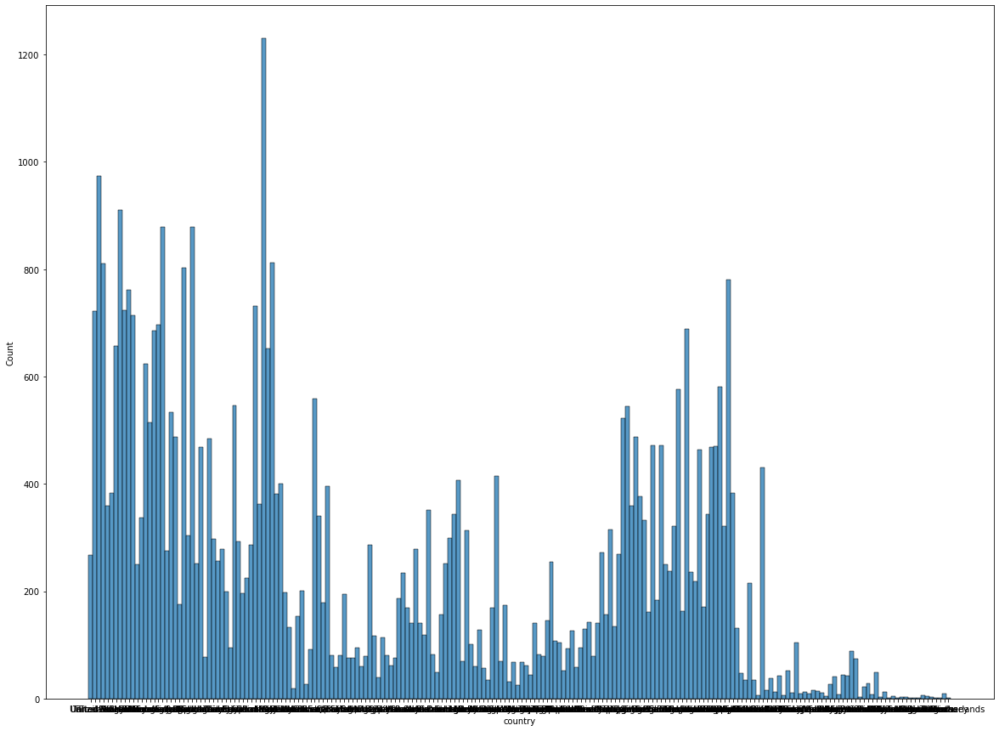

In [58]:
# plotting a histplot to see the distribution of countries 
plt.figure(figsize = (20, 15))
sns.histplot(x = 'country', data = adx_data)
plt.show()

### Since there is large amount of data, the plot is not clear, hence we will look at only top 20 countries

In [59]:
# segregate date of ad requests into days for in-depth analysis
adx_data['date'] = pd.to_datetime(adx_data['date'])
adx_data['Day'] = adx_data['date'].dt.day
adx_data['Month'] = adx_data['date'].dt.month

In [60]:
adx_data.head()

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue,Day,Month,show_rate,click_rate,mapped_app_id
0,2022-10-20,1987,16243270,22832846443,Tanzania,36,36,34,0,0.035738,20,10,0.944444,0.000000,9
1,2022-10-20,1987,16243270,22832846593,Tanzania,24,24,23,0,0.064384,20,10,0.958333,0.000000,9
2,2022-10-20,1987,16243270,22832846443,Thailand,949,949,876,20,4.943878,20,10,0.923077,0.022831,9
3,2022-10-20,1987,16243270,22832846593,Thailand,1006,907,688,134,24.226836,20,10,0.758545,0.194767,9
4,2022-10-20,1987,16243270,22832827729,Thailand,373,287,156,20,2.759392,20,10,0.543554,0.128205,9


#### Boxplot for Outlier Detection

<AxesSubplot:xlabel='show_rate'>

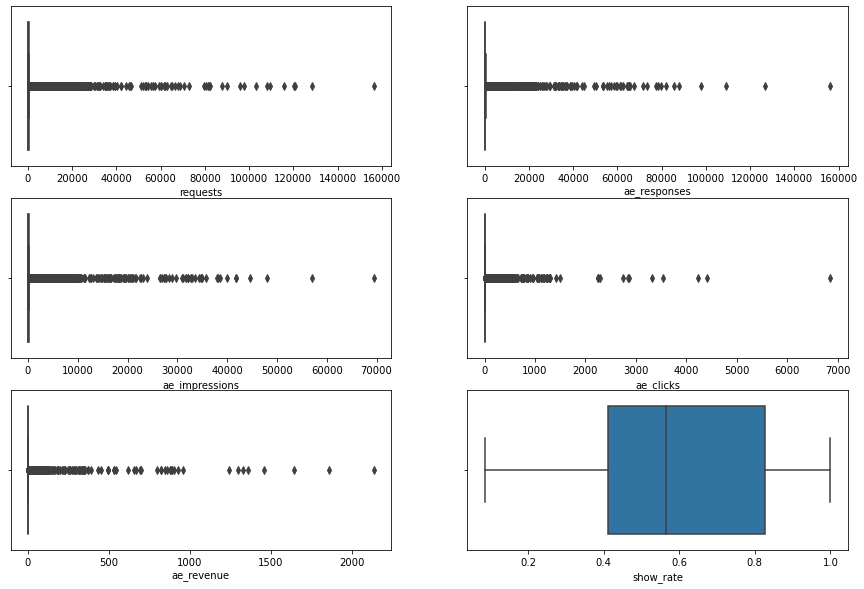

In [74]:
# look at outliers in important numeric columns
fig, axs = plt.subplots(3,2, figsize=(15,10))

# plot one
sns.boxplot(ax = axs[0, 0], x=adx_data['requests'])

# plot two
sns.boxplot(ax = axs[0, 1], x=adx_data['ae_responses'])

# plot three
sns.boxplot(ax = axs[1, 0], x=adx_data['ae_impressions'])

# plot four
sns.boxplot(ax = axs[1, 1], x=adx_data['ae_clicks'])

# plot five
sns.boxplot(ax = axs[2, 0], x=adx_data['ae_revenue'])

# plot six
sns.boxplot(ax = axs[2, 1], x=adx_data['show_rate'])


## Inference: 
Show Rate is Negatively skewed and all of the features have few observations that are very high in value and are hence considered as outliers

In [140]:
# check the summary statistics
adx_data.describe()

,pub_id,app_id,ad_unit_code,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue
count,47935.000000,4.793500e+04,4.793500e+04,47935.000000,47935.000000,47935.000000,47935.000000,47935.000000
mean,413.188213,5.015577e+07,2.268402e+10,585.827808,516.918202,257.055137,13.502514,2.098320
std,893.645657,2.465772e+07,1.215869e+08,3024.686475,2579.695718,1294.313552,73.922916,27.784254
min,14.000000,1.624327e+07,2.247747e+10,16.000000,16.000000,16.000000,0.000000,0.000111
25%,14.000000,2.559680e+07,2.252151e+10,50.000000,47.000000,27.000000,0.000000,0.026047
50%,51.000000,4.786228e+07,2.275208e+10,109.000000,100.000000,52.000000,2.000000,0.112968
75%,72.000000,4.786228e+07,2.277034e+10,300.000000,275.000000,140.000000,7.000000,0.537878
max,2808.000000,9.567477e+07,2.283576e+10,156435.000000,156296.000000,69448.000000,6853.000000,2137.181915


**Checking if the maximum number of requests, responses and impressions are coming from one application**

In [174]:
adx_data[adx_data['requests'] == adx_data['requests'].max()]

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue,Day,Month,show_rate,click_rate,mapped_app_id
14312,2022-10-09,281,40931528,22827807110,Australia,156435,156296,48011,2,1860.866497,9,10,0.30718,0.000042,6


In [175]:
adx_data[adx_data['ae_responses'] == adx_data['ae_responses'].max()]

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue,Day,Month,show_rate,click_rate,mapped_app_id
14312,2022-10-09,281,40931528,22827807110,Australia,156435,156296,48011,2,1860.866497,9,10,0.30718,0.000042,6


In [177]:
adx_data[adx_data['ae_impressions'] == adx_data['ae_impressions'].max()]

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue,Day,Month,show_rate,click_rate,mapped_app_id
14310,2022-10-09,281,40931528,22827475225,Australia,128311,126743,69448,21,2137.181915,9,10,0.547943,0.000302,6


### Inference:
Although the Application is same but the highest impressions are not coming from the same ad_unit_code

## Data Visualization


<Figure size 720x1440 with 0 Axes>

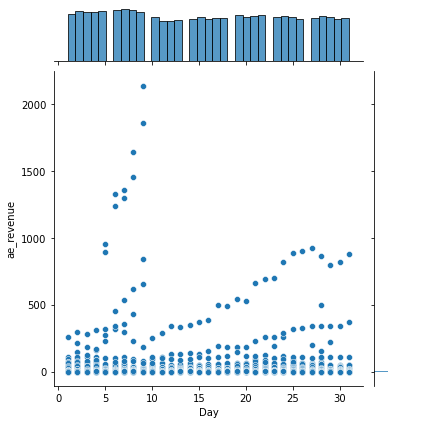

In [94]:
# Creating a jointplot of Days versus Revenue 
plt.figure(figsize=(10,20))
sns.jointplot(x='Day', y='ae_revenue', data=adx_data)

## Show Rate Analysis

<AxesSubplot:xlabel='Day', ylabel='ae_impressions'>

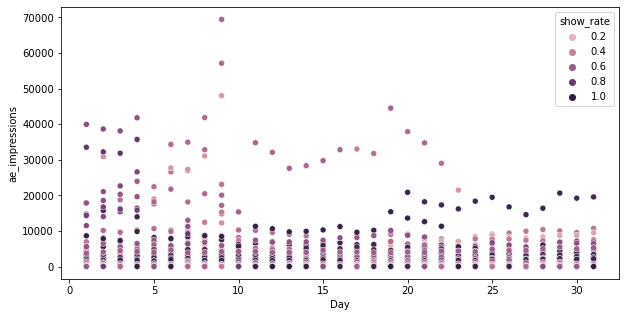

In [91]:
# scatterplot of Impressions on site and Days with show_rate as hue
sns.scatterplot(x = "Day", y= "ae_impressions",hue='show_rate', data = adx_data)

In [165]:
# grouping by each app to find its highest show rates
adx_data.groupby(by = 'app_id')['show_rate'].nlargest()

app_id         
16243270  445       3759
          259       3569
          446       2850
          247       2787
          433       2692
22693095  2324     10745
          11031    10393
          6714     10025
          4881      9905
          4144      9541
25596802  12362      484
          12050      418
          11971      389
          12201      380
          12717      366
40931528  14310    69448
          14309    57126
          14312    48011
          15645    41852
          14160    34939
43840611  16793    10654
          19019    10252
          19743    10218
          15893    10144
          20643     9841
47862278  22664    20840
          29012    20634
          23227    19553
          24586    19445
          25623    19203
63338696  36376    44503
          36220    37877
          36130    34778
          36287    34736
          36316    33011
66981243  36909    41785
          36685    39941
          36851    38639
          36778    38097
         

In [167]:
# grouping by each app to find its highest show rates
adx_data['ae_responses'].nlargest()

14312    156296
14310    126743
14309    109177
15647     97635
15129     87806
Name: ae_responses, dtype: int64

<AxesSubplot:>

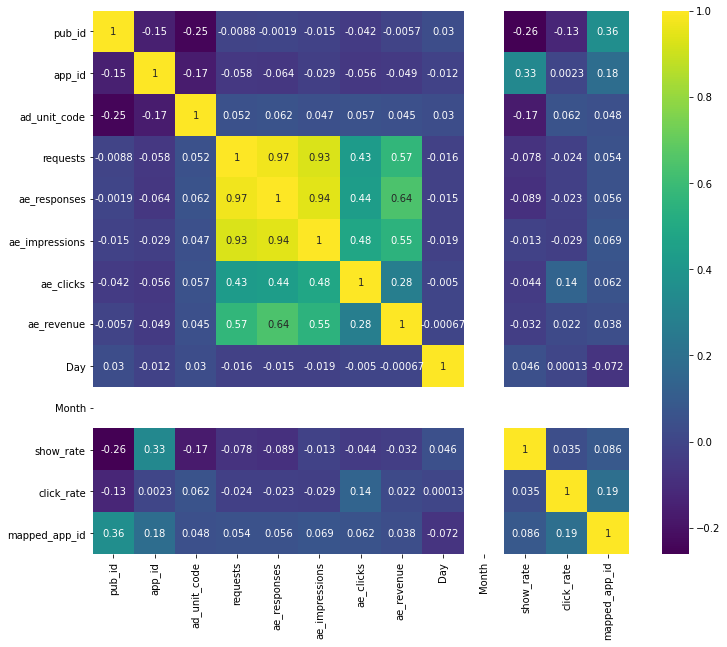

In [93]:
# Degree of relationship i.e correlation using heatmap
fig = plt.figure(figsize = (12,10))
sns.heatmap(adx_data.corr(), cmap='viridis', annot = True) 

In [83]:
# grouping by each app to find its highest click rates
adx_data.groupby(by = 'app_id')['click_rate'].nlargest(5)

app_id         
16243270  67       0.631579
          512      0.375000
          504      0.352381
          481      0.345679
          503      0.300505
22693095  1420     0.818182
          10697    0.666667
          6634     0.608696
          9618     0.600000
          11465    0.600000
25596802  12691    0.789474
          12293    0.687500
          12801    0.500000
          13158    0.500000
          13248    0.500000
40931528  13908    0.687500
          13477    0.400000
          13805    0.400000
          14853    0.391304
          13491    0.375000
43840611  18609    0.423077
          16396    0.421053
          16110    0.360000
          17074    0.360000
          16975    0.352941
47862278  34433    0.512346
          31712    0.352941
          31708    0.312500
          34189    0.312500
          24417    0.300000
63338696  36611    0.833333
          36309    0.631579
          36498    0.625000
          36306    0.562500
          36221    0.545455
6698

### Encoding the app_id numbers for easier analysis

In [36]:
adx_data['app_id'].value_counts()

47862278    14817
22693095    11203
95674771     5971
43840611     5390
84650721     4894
40931528     2281
25596802     1598
63338696      557
16243270      518
66981243      286
Name: app_id, dtype: int64

In [48]:
scale_mapper = {47862278:1, 22693095:2, 95674771:3, 43840611:4, 84650721:5, 40931528:6, 25596802:7, 
                63338696:8, 16243270:9, 66981243: 10}

In [49]:
from sklearn.preprocessing import OrdinalEncoder
# creating a new column for mapped values 
adx_data['mapped_app_id'] = adx_data['app_id'].map(scale_mapper)

In [50]:
adx_data.head()

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue,Day,Month,show_rate,click_rate,mapped_app_id
0,2022-10-20,1987,16243270,22832846443,Tanzania,36,36,34,0,0.035738,20,10,0.944444,0.000000,9
1,2022-10-20,1987,16243270,22832846593,Tanzania,24,24,23,0,0.064384,20,10,0.958333,0.000000,9
2,2022-10-20,1987,16243270,22832846443,Thailand,949,949,876,20,4.943878,20,10,0.923077,0.022831,9
3,2022-10-20,1987,16243270,22832846593,Thailand,1006,907,688,134,24.226836,20,10,0.758545,0.194767,9
4,2022-10-20,1987,16243270,22832827729,Thailand,373,287,156,20,2.759392,20,10,0.543554,0.128205,9


In [96]:
# check countries of app_id = 22693095
adx_data.loc[adx_data['mapped_app_id']==2]

,date,pub_id,app_id,ad_unit_code,country,requests,ae_responses,ae_impressions,ae_clicks,ae_revenue,Day,Month,show_rate,click_rate,mapped_app_id
521,2022-10-11,14,22693095,22752632444,Chad,267,267,84,11,0.161835,11,10,0.314607,0.130952,2
522,2022-10-11,14,22693095,22752080475,Chad,194,132,79,15,0.379081,11,10,0.598485,0.189873,2
523,2022-10-11,14,22693095,22752632444,Fiji,92,88,39,2,0.029382,11,10,0.443182,0.051282,2
524,2022-10-11,14,22693095,22752080475,Laos,309,212,103,34,0.625533,11,10,0.485849,0.330097,2
525,2022-10-11,14,22693095,22752632444,Laos,419,412,134,14,0.233146,11,10,0.325243,0.104478,2
526,2022-10-11,14,22693095,22752080475,Mali,669,518,262,64,1.195362,11,10,0.505792,0.244275,2
527,2022-10-11,14,22693095,22752632444,Mali,1137,1113,474,49,0.603684,11,10,0.425876,0.103376,2
528,2022-10-11,14,22693095,22752080667,Mali,34,34,31,8,0.082542,11,10,0.911765,0.258065,2
529,2022-10-11,14,22693095,22752632444,Togo,78,78,25,0,0.007686,11,10,0.320513,0.000000,2
530,2022-10-11,14,22693095,22752632444,Benin,87,76,26,1,0.011450,11,10,0.342105,0.038462,2


<AxesSubplot:xlabel='country'>

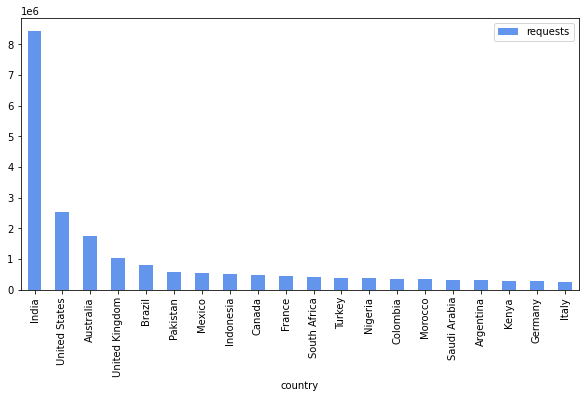

In [16]:
# plot a barplot to look at top 20 countries with highest ad requests
top_requests = pd.DataFrame(adx_data.groupby('country').sum()['requests'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_requests.head(20).plot.bar(color = 'cornflowerblue')

<AxesSubplot:xlabel='mapped_app_id'>

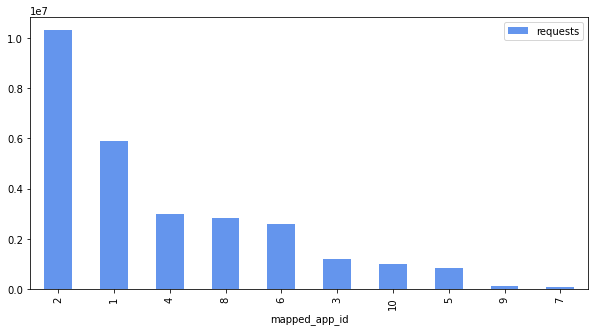

In [51]:
# plot a barplot to look at top 20 countries with highest ad requests
top_requests = pd.DataFrame(adx_data.groupby('mapped_app_id').sum()['requests'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_requests.head(20).plot.bar(color = 'cornflowerblue')

<AxesSubplot:xlabel='country'>

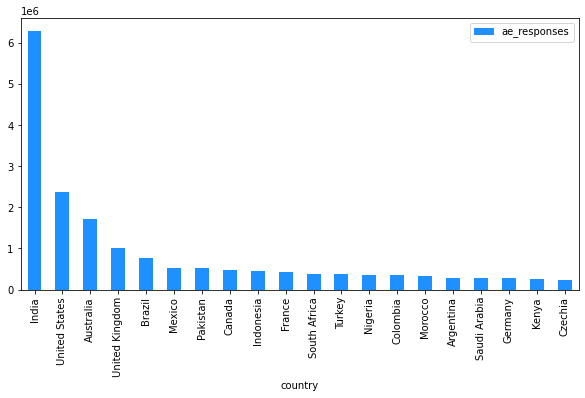

In [17]:
top_responses = pd.DataFrame(adx_data.groupby('country').sum()['ae_responses'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_responses.head(20).plot.bar(color = 'dodgerblue')

<AxesSubplot:xlabel='mapped_app_id'>

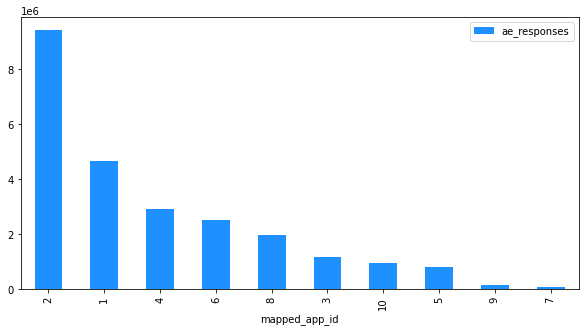

In [52]:
top_responses = pd.DataFrame(adx_data.groupby('mapped_app_id').sum()['ae_responses'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_responses.head(20).plot.bar(color = 'dodgerblue')

<AxesSubplot:xlabel='country'>

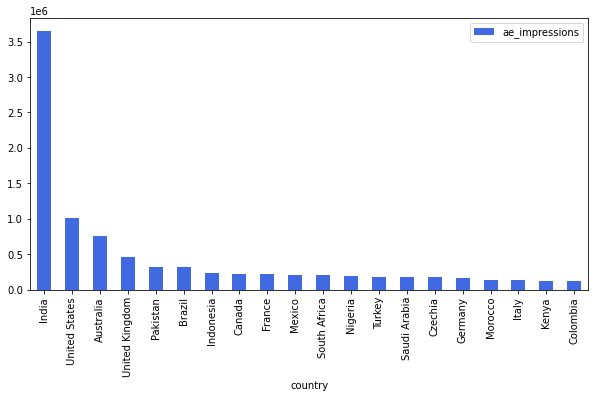

In [27]:
top_impressions = pd.DataFrame(adx_data.groupby('country').sum()['ae_impressions'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_impressions.head(20).plot.bar(color = 'royalblue')

<AxesSubplot:xlabel='mapped_app_id'>

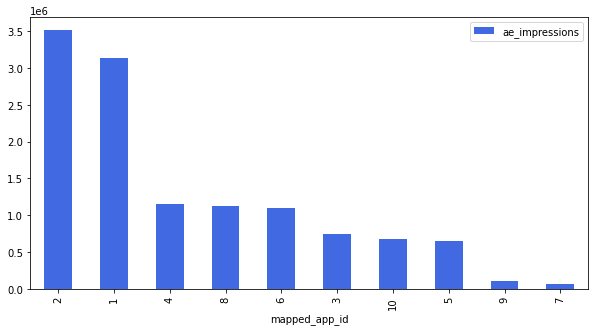

In [53]:
top_impressions = pd.DataFrame(adx_data.groupby('mapped_app_id').sum()['ae_impressions'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_impressions.head(20).plot.bar(color = 'royalblue')

<AxesSubplot:xlabel='country'>

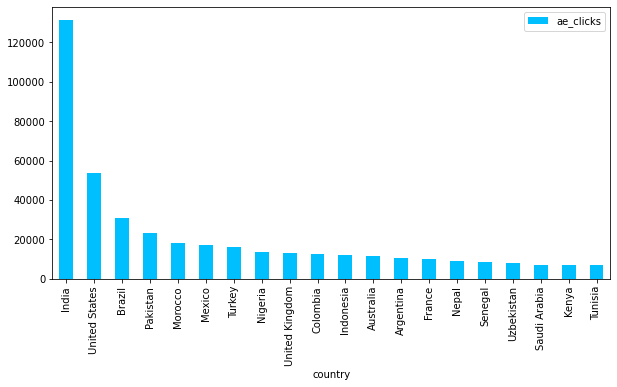

In [28]:
top_clicks = pd.DataFrame(adx_data.groupby('country').sum()['ae_clicks'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_clicks.head(20).plot.bar(color = 'deepskyblue')

<AxesSubplot:xlabel='mapped_app_id'>

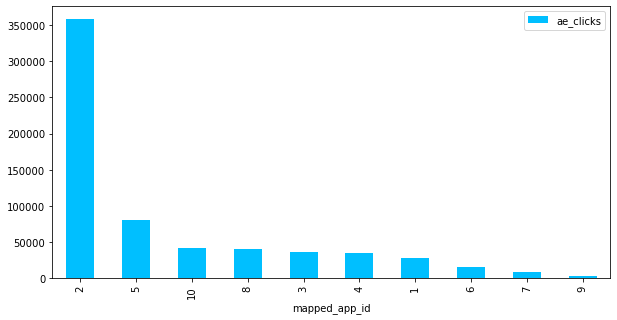

In [54]:
top_clicks = pd.DataFrame(adx_data.groupby('mapped_app_id').sum()['ae_clicks'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_clicks.head(20).plot.bar(color = 'deepskyblue')

<AxesSubplot:xlabel='country'>

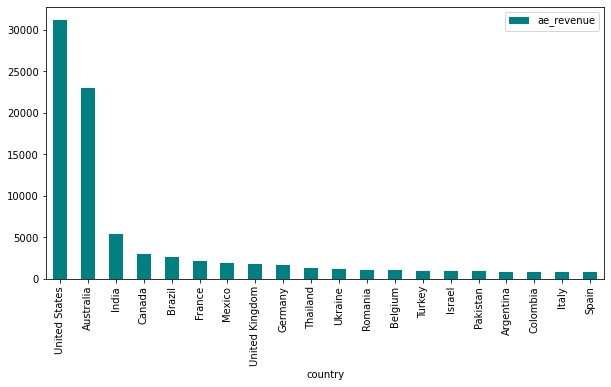

In [20]:
top_revenue = pd.DataFrame(adx_data.groupby('country').sum()['ae_revenue'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_revenue.head(20).plot.bar(color = 'teal')

<AxesSubplot:xlabel='mapped_app_id'>

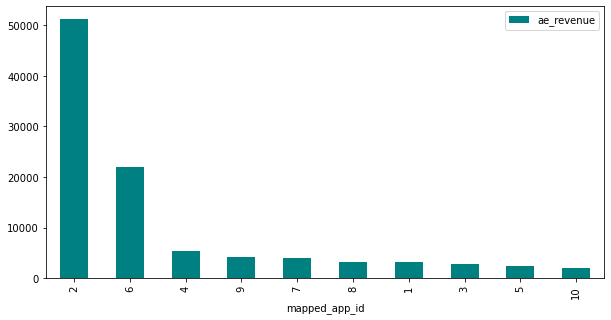

In [55]:
top_revenue = pd.DataFrame(adx_data.groupby(['mapped_app_id']).sum()['ae_revenue'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_revenue.head(20).plot.bar(color = 'teal')

<AxesSubplot:xlabel='country'>

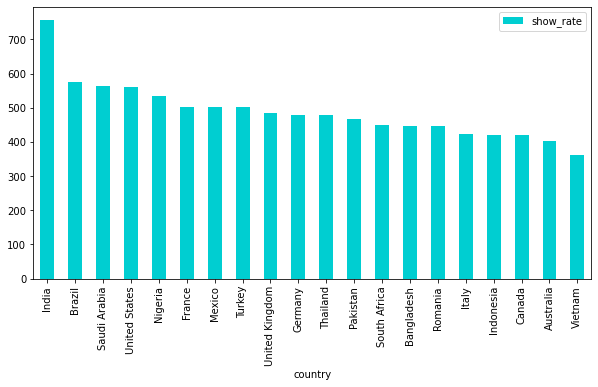

In [21]:
adx_data['show_rate'] = adx_data['ae_impressions']/adx_data['ae_responses']
top_showrate = pd.DataFrame(adx_data.groupby('country').sum()['show_rate'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_showrate.head(20).plot.bar(color = 'darkturquoise')

<AxesSubplot:xlabel='mapped_app_id'>

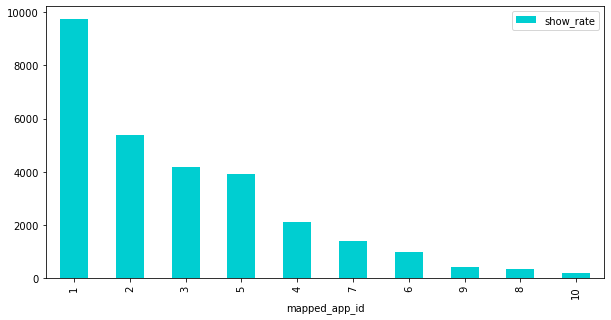

In [56]:
top_showrate = pd.DataFrame(adx_data.groupby('mapped_app_id').sum()['show_rate'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_showrate.head(20).plot.bar(color = 'darkturquoise')

<AxesSubplot:xlabel='country'>

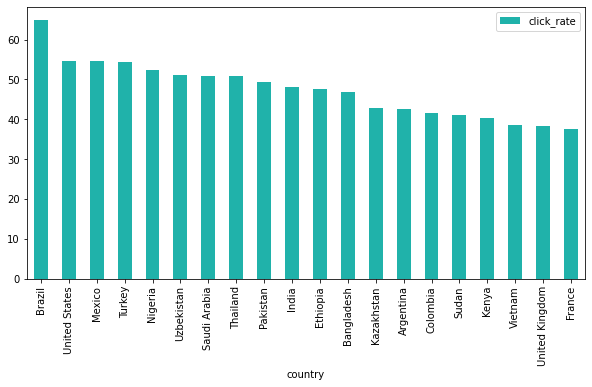

In [22]:
adx_data['click_rate'] = adx_data['ae_clicks']/adx_data['ae_impressions']
top_clickrate = pd.DataFrame(adx_data.groupby('country').sum()['click_rate'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_clickrate.head(20).plot.bar(color = 'lightseagreen')

<AxesSubplot:xlabel='mapped_app_id'>

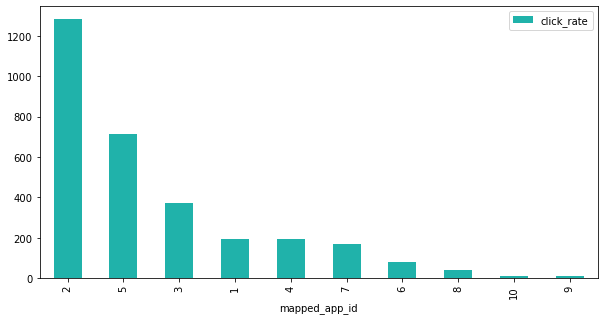

In [57]:
top_clickrate = pd.DataFrame(adx_data.groupby('mapped_app_id').sum()['click_rate'].sort_values(ascending = False))
plt.rcParams["figure.figsize"] = (10, 5)
top_clickrate.head(20).plot.bar(color = 'lightseagreen')